In [1]:
import numpy as np
import pandas as pd
pd.options.display.max_columns = None

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px

from sklearn.model_selection import StratifiedKFold, train_test_split, GridSearchCV
from sklearn.metrics import roc_auc_score, average_precision_score, roc_curve, precision_recall_curve, f1_score
from sklearn.linear_model import LogisticRegression as logit 
from sklearn.feature_selection import SequentialFeatureSelector as SFS, SelectFromModel
from sklearn.tree import DecisionTreeClassifier as DTC, plot_tree
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.svm import SVC

from xgboost import XGBClassifier as XGBC

In [2]:
#DATA EXPLORATION

#load data
aki = pd.read_csv('sph6004_assignment1_data.csv')
print(aki.describe())

#explore race
aki['race'].value_counts()
aki['race'].value_counts()[['MULTIPLE RACE/ETHNICITY', 'OTHER', 'PATIENT DECLINED TO ANSWER', 'UNABLE TO OBTAIN', 'UNKNOWN']].sum()
#8470
print(aki.id.count()*0.05) #2546, therefore dropping race later

#explore GCS
print('GCS verbal NaN')
print(aki['gcs_verbal'].value_counts()[0]) #10450

                 id           aki  admission_age  heart_rate_min  \
count  5.092000e+04  50920.000000   50920.000000    50841.000000   
mean   3.498391e+07      1.300393      64.942008       69.902996   
std    2.893873e+06      1.088128      17.278264       15.141810   
min    3.000015e+07      0.000000      18.002527        1.000000   
25%    3.246663e+07      0.000000      54.503884       60.000000   
50%    3.498649e+07      1.000000      66.713334       69.000000   
75%    3.748413e+07      2.000000      78.151289       79.000000   
max    3.999981e+07      3.000000     102.865603      167.000000   

       heart_rate_max  heart_rate_mean       sbp_min       sbp_max  \
count    50841.000000     50841.000000  50823.000000  50823.000000   
mean       102.494951        84.266427     93.250232    148.234674   
std         20.481365        15.726366     17.550959     22.737214   
min         36.000000        28.500000      0.108000     34.000000   
25%         88.000000        73.22916

In [4]:
#DATA CLEANING + feature pruning

#convert aki column to binary
aki['bi_aki'] = aki.apply(lambda row: 1 if row.aki >0 else 0, axis =1)

#convert gender into binary
# aki['gender'].unique() #CHECK unique values
aki['gender']= aki.apply(lambda row: 1 if row.gender =='M' else 0, axis =1)

#drop columns with > 5% null & irrelevant column
drop_thresh5 = aki.id.count()*0.95
aki = aki.dropna(thresh = drop_thresh5, axis=1)
aki=aki.drop(['aki', 
              'id', 
              'race', 
              'gcs_verbal', 
              'gcs_min',
              'temperature_min', 
              'temperature_max', 
              'temperature_mean', 
              'weight_admit'], axis =1)
aki= aki.dropna()

#Split into x and y
X_raw = aki.iloc[:, 0:-1]
y_true = aki.iloc[:, -1]

print(X_raw.describe())

#number of aki cases and percentage, checking for imbalance output
print('Percentage positive aki: ' +str((y_true.sum() / y_true.count())))

             gender  admission_age  heart_rate_min  heart_rate_max  \
count  48375.000000   48375.000000    48375.000000    48375.000000   
mean       0.559731      65.031863       69.912418      102.613660   
std        0.496424      17.139864       14.982848       20.429277   
min        0.000000      18.002527        1.000000       36.000000   
25%        0.000000      54.661754       60.000000       88.000000   
50%        1.000000      66.758061       69.000000      100.000000   
75%        1.000000      78.086169       79.000000      114.000000   
max        1.000000     102.865603      163.000000      280.000000   

       heart_rate_mean       sbp_min       sbp_max      sbp_mean  \
count     48375.000000  48375.000000  48375.000000  48375.000000   
mean         84.280890     93.103391    148.491135    119.138249   
std          15.660193     17.242497     22.559207     16.182869   
min          28.500000      0.108000     70.000000     56.875000   
25%          73.250000     83

In [5]:
#NORMALISE DATA
x_df = (X_raw-X_raw.mean(numeric_only=True))/X_raw.std(numeric_only=True)
x_df.describe()

,gender,admission_age,heart_rate_min,heart_rate_max,heart_rate_mean,sbp_min,sbp_max,sbp_mean,dbp_min,dbp_max,dbp_mean,mbp_min,mbp_max,mbp_mean,resp_rate_min,resp_rate_max,resp_rate_mean,spo2_min,spo2_max,spo2_mean,glucose_min,glucose_max,glucose_mean,hematocrit_min.1,hematocrit_max.1,hemoglobin_min.1,hemoglobin_max.1,platelets_min,platelets_max,wbc_min,wbc_max,aniongap_min,aniongap_max,bicarbonate_min.1,bicarbonate_max.1,bun_min,bun_max,chloride_min.1,chloride_max.1,glucose_min.2,glucose_max.2,sodium_min.1,sodium_max.1,potassium_min.1,potassium_max.1,gcs_motor,gcs_eyes,gcs_unable
count,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04,4.837500e+04
mean,2.908268e-17,-5.261321e-16,-2.846577e-16,4.804517e-16,2.696758e-16,3.357728e-16,1.238952e-15,2.530781e-16,1.332222e-16,-8.652097e-16,-8.718929e-16,-2.714383e-16,4.078919e-16,1.273763e-15,-9.282956e-17,2.593940e-16,3.384166e-16,-5.581524e-17,-1.535800e-15,2.283284e-15,-1.468822e-19,2.937644e-18,3.892379e-18,-6.080924e-17,-8.754180e-17,8.812933e-18,5.878226e-16,-1.269062e-16,8.342910e-17,-4.377090e-17,-1.263187e-17,-9.150762e-17,-2.276674e-16,-2.057820e-16,-2.643880e-18,9.047945e-17,-5.111501e-17,-2.167982e-16,-1.006437e-15,-8.592610e-17,-1.363067e-16,-2.284900e-15,-1.713675e-15,-7.197229e-17,-3.231409e-17,2.510952e-16,-1.797838e-16,-6.066236e-17
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-1.127525e+00,-2.743857e+00,-4.599420e+00,-3.260696e+00,-3.561954e+00,-5.393383e+00,-3.479339e+00,-3.847479e+00,-3.996375e+00,-3.136589e+00,-3.848185e+00,-4.327384e+00,-2.359105e+00,-3.685392e+00,-3.210027e+00,-2.617061e+00,-2.774333e+00,-1.449058e+01,-4.642197e+01,-2.461977e+01,-2.351573e-02,-3.094533e-02,-2.987447e-02,-4.032388e+00,-3.746706e+00,-3.996628e+00,-3.849987e+00,-1.901427e+00,-2.036126e+00,-1.322473e+00,-1.221552e+00,-6.332234e+00,-2.683310e+00,-4.319749e+00,-4.817284e+00,-1.132915e+00,-1.163938e+00,-9.088318e+00,-6.405903e+00,-2.833310e+00,-1.567453e+00,-1.252463e+01,-9.068053e+00,-5.639663e+00,-3.562857e+00,-2.526293e+00,-1.939731e+00,-5.082182e-01
25%,-1.127525e+00,-6.050287e-01,-6.615843e-01,-7.153293e-01,-7.043904e-01,-5.859587e-01,-6.866879e-01,-7.179350e-01,-6.227984e-01,-6.886108e-01,-6.992089e-01,-5.154586e-01,-5.880002e-01,-6.962367e-01,-6.515336e-01,-7.258115e-01,-7.002416e-01,-1.357947e-01,-3.599598e-01,-5.036797e-01,-9.846898e-03,-2.742787e-02,-2.093858e-02,-7.336374e-01,-7.268558e-01,-7.427341e-01,-7.081532e-01,-6.531749e-01,-6.326036e-01,-4.572299e-01,-4.467998e-01,-5.751599e-01,-6.374854e-01,-4.041835e-01,-6.042524e-01,-5.924167e-01,-5.621710e-01,-5.125265e-01,-6.365636e-01,-6.004458e-01,-5.090994e-01,-3.891816e-01,-5.860187e-01,-5.741059e-01,-6.375320e-01,-1.078369e-01,-1.193635e-01,-5.082182e-01
50%,8.868796e-01,1.007125e-01,-6.089747e-02,-1.279370e-01,-9.456395e-02,-6.399255e-02,-1.104265e-01,-1.365442e-01,-1.728460e-02,-1.276159e-01,-1.

In [6]:
#TEST TRAIN SPLIT

X_train, X_test, y_train, y_test = train_test_split(
    x_df,y_true,test_size=0.3,random_state=10,
    stratify=y_true, shuffle=True
)

In [7]:
#FEATURE SELECTION USING LASSO REGRESSION

lr_L1= SelectFromModel(logit(penalty='l1',C=1/10,solver='liblinear'))
lr_L1.fit(X_train, y_train)

SelectFromModel(estimator=LogisticRegression(C=0.1, penalty='l1',
                                             solver='liblinear'))

In [8]:
#feature selection
selected = X_train.columns[(lr_L1.get_support())]
removed = X_train.columns[(lr_L1.estimator_.coef_ == 0).ravel().tolist()]
print('No. selected features: {}'.format(len(selected)))
print('Remove feature: {}'.format(removed))


No. selected features: 47
Remove feature: Index(['dbp_min'], dtype='object')


In [9]:
#drop unselected feat
X_train.drop(removed, axis=1)
X_test.drop(removed,axis=1)


,gender,admission_age,heart_rate_min,heart_rate_max,heart_rate_mean,sbp_min,sbp_max,sbp_mean,dbp_max,dbp_mean,mbp_min,mbp_max,mbp_mean,resp_rate_min,resp_rate_max,resp_rate_mean,spo2_min,spo2_max,spo2_mean,glucose_min,glucose_max,glucose_mean,hematocrit_min.1,hematocrit_max.1,hemoglobin_min.1,hemoglobin_max.1,platelets_min,platelets_max,wbc_min,wbc_max,aniongap_min,aniongap_max,bicarbonate_min.1,bicarbonate_max.1,bun_min,bun_max,chloride_min.1,chloride_max.1,glucose_min.2,glucose_max.2,sodium_min.1,sodium_max.1,potassium_min.1,potassium_max.1,gcs_motor,gcs_eyes,gcs_unable
6836,-1.127525,1.143403,0.873504,1.585291,0.902065,-0.759947,-0.332066,-0.446043,-0.127616,0.774154,0.217604,-0.306234,0.249073,-0.367257,-0.725811,-0.885560,-0.933283,-0.359960,-0.820740,-0.002537,-0.026954,-0.017999,-0.208836,-0.514650,-0.259047,-0.567474,0.738320,0.486545,-0.470144,-0.614076,0.288401,0.590010,1.336068,1.378351,-0.430267,-0.284432,-0.188912,-0.801402,-0.401969,-0.289441,0.804469,0.898337,-0.755019,-1.125086,0.496777,0.790821,-0.508218
26593,0.886880,0.479410,0.005846,1.830037,0.235664,-1.107925,-0.908327,-1.431344,-0.790610,-0.850077,-0.295540,-0.547748,-0.918619,-0.082980,0.850230,-0.081383,0.980689,0.448146,1.106653,-0.007669,-0.025373,-0.018469,-1.723262,-1.232885,-1.842023,-1.083298,1.679625,2.578069,0.227216,2.564169,0.000547,-0.023738,-0.839246,-0.852078,-0.808616,-0.747330,0.943740,0.846981,-0.327540,-0.029845,0.406586,0.262185,-1.840495,-0.515643,0.496777,-0.119363,-0.508218
42951,-1.127525,0.553791,-0.127640,0.214709,0.496904,0.863947,1.263735,1.426667,-0.229615,-0.503099,0.510829,0.579319,0.655619,-0.651534,-0.725811,-0.331880,-0.295292,0.448146,-0.515569,-0.004403,-0.024780,-0.017000,-0.703649,-1.004356,-0.434933,-0.801939,-0.438312,-0.687644,-0.676769,-0.702116,0.000547,-0.432903,0.901005,0.634875,-0.592417,-0.701040,0.620125,0.352466,0.094223,-0.129690,1.003411,1.110388,-1.116844,-1.125086,-0.107837,-1.029547,1.967618
44507,-1.127525,-0.343294,-0.861813,-0.911127,-1.253554,1.733891,1.175080,1.538772,0.178381,-0.699209,0.510829,0.096290,0.429007,-1.220088,-0.252999,-0.320578,-0.135795,0.448146,-0.680566,0.003218,-0.022330,-0.010192,0.300971,-0.367738,0.312583,-0.286116,-0.141596,-0.458310,0.046419,-0.288328,0.288401,-0.432903,0.248411,-0.356427,-0.322167,-0.469591,0.296510,-0.306887,1.607609,0.199798,0.804469,0.262185,0.149545,-0.637532,0.496777,0.790821,-0.508218
33934,-1.127525,0.408433,-0.528098,-0.176886,0.115097,-0.237981,-0.154754,-0.038204,-1.147607,-0.920929,-0.002315,-0.547748,-0.513427,-0.651534,-1.829040,-1.311044,0.502196,0.448146,0.475402,-0.011402,-0.025728,-0.019388,-0.793615,-0.318768,-0.962592,-0.567474,-0.714564,-0.540870,2.797119,4.377794,-0.863014,-0.432903,0.465942,0.387049,-0.322167,-0.284432,-0.027104,0.187628,-0.526017,-0.658866,-0.588123,0.050134,-0.031368,-0.028089,0.496777,0.790821,-0.508218
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45511,0.886880,1.046899,-2.864103,-0.568481,-0.993194,0.689959,0.510163,0.800393,-0.484613,-0.143826,0.510829,0.096290,0.757187,-0.367257,-0.568207,-0.683580,0.183201,0.448146,0.726130,-0.007669,-0.026756,-0.019444,-0.463740,-0.726856,-0.039190,-0.239223,-1.082901,-1.256391,-0.805910,-0.746136,-0.287306,-0.228320,0.683474,0.387049,-0.484317,-0.423302,-0.674334,-0.306887,-0.426779,-0.349348,-0.190240,-0.161917,-2.564146,-0.637532,0.496777,-1.939731,-0.508218
30909,0.886880,0.876024,-0.261126,-1.057975,-0.869352,-0.411970,-1.218622,-1.085519,-1.657602,-1.674365,-0.515459,-1.071029,-1.511289,0.201298,-0.883416,-0.622434,0.342698,0.448146,1.040160,-0.007980,-0.025412,-0.019299,-0.643671,-0.367738,-0.478905,-0.145437,-0.775954,-0.733510,-0.173120,0.107852,-0.863014,-0.842068,0.030879,-0.108602,-0.430267,-0.515881,0.781933,0.517304,0.119033,-0.399270,0.008702,-0.161917,-0.212280,0.215688,-2.526293,-1.939731,1.967618
6468,-1.127525,-

[Text(0.5, 1.0, 'Correlation of Features')]

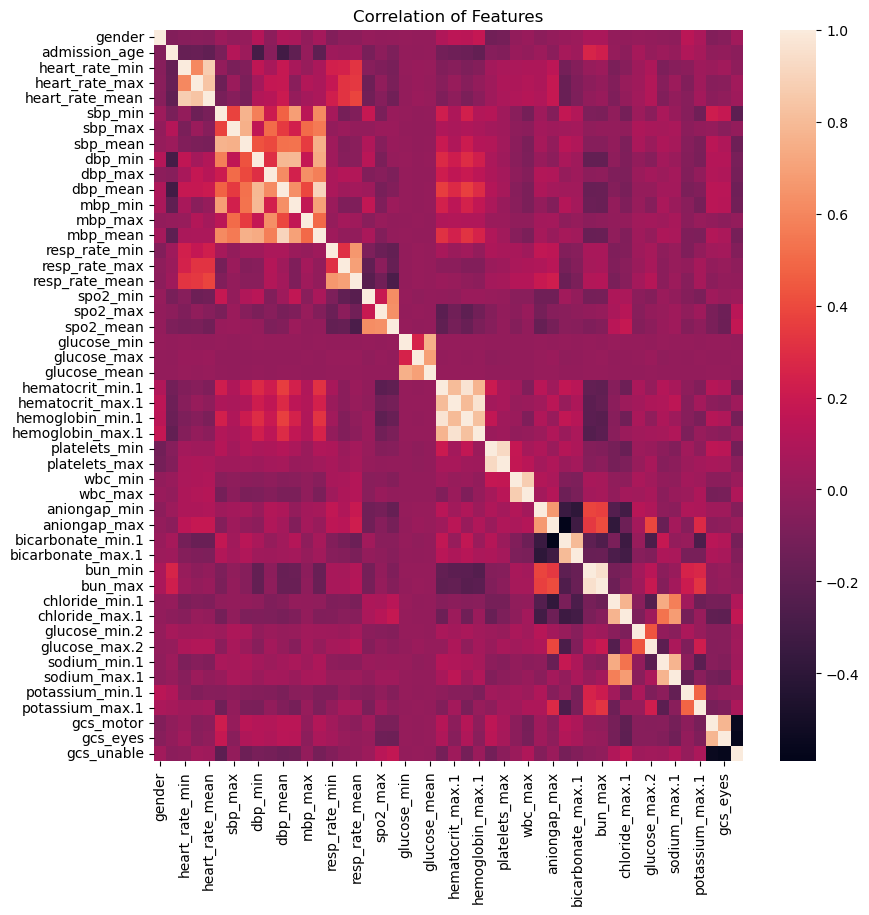

In [10]:
#CORRELATION OF FEATURES
corr_hm=x_df.apply(x_df.corrwith, numeric_only =True)
plt.subplots(figsize=(9.5,9.5))
sns.heatmap(corr_hm).set(title='Correlation of Features')

In [11]:
#L2
#FORWARD FEATURE SELECTION -L2

L2= logit(C=1/10,solver='liblinear')

forward_selection = SFS(
    L2, n_features_to_select=3, direction="forward"
).fit(X_train, y_train)

fL2_feat = forward_selection.get_feature_names_out()


In [12]:
#check if linearly separable
fig = px.scatter_3d(
    aki,
    z=x_df[fL2_feat[0]],
    y=x_df[fL2_feat[1]],
    x=x_df[fL2_feat[2]],
    color='bi_aki'
)

fig.update_traces(
    marker={'size':2.5}
)

fig

In [13]:
#BACKWARD FEATURE SELECTION -L2

backward_selection = SFS(
    L2, n_features_to_select=3, direction="backward"
).fit(X_train, y_train)

bL2_feat=backward_selection.get_feature_names_out()


In [14]:
#check if linearly separable
fig = px.scatter_3d(
    aki,
    z=x_df[bL2_feat[0]],
    y=x_df[bL2_feat[1]],
    x=x_df[bL2_feat[2]],
    color='bi_aki'
)

fig.update_traces(
    marker={'size':2.5}
)

fig

In [15]:
#DECISION TREE
#Forward feature selection -DT

dt = DTC(criterion='entropy',max_depth=1,random_state=15)

forward_selection = SFS(
    dt, n_features_to_select=3, direction="forward"
).fit(X_train, y_train)

fdt_feat = forward_selection.get_feature_names_out()

In [16]:
#Backward feature selection -DT

backward_selection = SFS(
    dt, n_features_to_select=3, direction="backward"
).fit(X_train, y_train)

bdt_feat = backward_selection.get_feature_names_out()

In [17]:
#DT with selected forward features

dt = DTC(criterion='entropy')

parameters = {'max_depth':np.arange(start=1,stop=10,step=1)}
stratifiedCV = StratifiedKFold(n_splits=10)
Best_dt = GridSearchCV(
    dt,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV
)

Best_dt.fit(forward_selection.transform(X_train),y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(criterion='entropy'),
             param_grid={'max_depth': array([1, 2, 3, 4, 5, 6, 7, 8, 9])},
             scoring='f1')

In [18]:
Best_dt.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=1)

In [19]:
Best_dt.best_score_

0.8106076548450828

In [20]:
#TEST-DT with forward selected features

f_dt_pred = Best_dt.predict(forward_selection.transform(X_test))
f_dt_pp=Best_dt.predict_proba(forward_selection.transform(X_test))

fdt_posProb = f_dt_pp[:,-1]

fdt_f1 = f1_score(y_test, f_dt_pred)
fdt_auroc = roc_auc_score(y_test, f_dt_pp[:,-1])
print(fdt_f1)
print(fdt_auroc)
pd.crosstab(y_test, f_dt_pred)

0.8106048188821504
0.5797393011781687


col_0,1
bi_aki,
0,4622
1,9891


In [21]:
#DT with selected backward features

Best_dt.fit(backward_selection.transform(X_train),y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=DecisionTreeClassifier(criterion='entropy'),
             param_grid={'max_depth': array([1, 2, 3, 4, 5, 6, 7, 8, 9])},
             scoring='f1')

In [22]:
Best_dt.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=1)

In [23]:
Best_dt.best_score_

0.8106076548450828

In [24]:
#TEST-DT with selected backward feature  

b_dt_pred = Best_dt.predict(backward_selection.transform(X_test))
b_dt_pp = Best_dt.predict_proba(backward_selection.transform(X_test))

bdt_posProb = b_dt_pp[:,-1]

bdt_f1 = f1_score(y_test, b_dt_pred)
bdt_auroc = roc_auc_score(y_test, b_dt_pp[:,-1])
print(bdt_f1)
print(bdt_auroc)
pd.crosstab(y_test, b_dt_pred)

0.8106048188821504
0.5742540686122614


col_0,1
bi_aki,
0,4622
1,9891


In [25]:
#RANDOM FOREST
#Forward feature selection -RF

rf = RandomForestClassifier(criterion='entropy',max_depth=1,random_state=15)

forward_selection = SFS(
    rf, n_features_to_select=3, direction="forward"
).fit(X_train, y_train)

frf_feat = forward_selection.get_feature_names_out()

In [26]:
#Backward feature selection -RF

backward_selection = SFS(
    rf, n_features_to_select=3, direction="backward"
).fit(X_train, y_train)

brf_feat = backward_selection.get_feature_names_out()


In [27]:
#RF with forward selected feature

rf = RandomForestClassifier(criterion='entropy')

parameters = {'max_depth':np.arange(start=1,stop=10,step=1)}
stratifiedCV = StratifiedKFold(n_splits=10)
Best_rf = GridSearchCV(
    rf,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV
)

Best_rf.fit(forward_selection.transform(X_train),y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(criterion='entropy'),
             param_grid={'max_depth': array([1, 2, 3, 4, 5, 6, 7, 8, 9])},
             scoring='f1')

In [28]:
Best_rf.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=4)

In [29]:
Best_rf.best_score_

0.8109544044597484

In [30]:
#Test-RF with forward selected feature

f_rf_pred = Best_rf.predict(forward_selection.transform(X_test))
f_rf_pp=Best_rf.predict_proba(forward_selection.transform(X_test))

frf_posProb = f_rf_pp[:,-1]

frf_f1 = f1_score(y_test, f_rf_pred)
frf_auroc = roc_auc_score(y_test, f_rf_pp[:,-1])
print(frf_f1)
print(frf_auroc)
pd.crosstab(y_test, f_rf_pred)

0.8114428899561495
0.6224444782180286


col_0,0,1
bi_aki,,
0,283,4339
1,176,9715


In [31]:
#RF with backward selected features

Best_rf.fit(backward_selection.transform(X_train),y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=RandomForestClassifier(criterion='entropy'),
             param_grid={'max_depth': array([1, 2, 3, 4, 5, 6, 7, 8, 9])},
             scoring='f1')

In [32]:
Best_rf.best_estimator_

RandomForestClassifier(criterion='entropy', max_depth=1)

In [33]:
Best_rf.best_score_

0.8106076548450828

In [34]:
#Test-RF with backward selected features

b_rf_pred = Best_rf.predict(backward_selection.transform(X_test))
b_rf_pp=Best_rf.predict_proba(backward_selection.transform(X_test))

brf_posProb = b_rf_pp[:,-1]

brf_f1 = f1_score(y_test, b_rf_pred)
brf_auroc = roc_auc_score(y_test, b_rf_pp[:,-1])
print(brf_f1)
print(brf_auroc)
pd.crosstab(y_test, b_rf_pred)

0.8106048188821504
0.5924815779753534


col_0,1
bi_aki,
0,4622
1,9891


In [35]:
#ADA BOOST
#Forward feature selection -AB

ab = AdaBoostClassifier(random_state=15)

forward_selection = SFS(
    ab, n_features_to_select=3, direction="forward"
).fit(X_train, y_train)

fab_feat = forward_selection.get_feature_names_out()


In [36]:
#Backward feature selection -AB

backward_selection = SFS(
    ab, n_features_to_select=3, direction="backward"
).fit(X_train, y_train)

bab_feat = backward_selection.get_feature_names_out()


In [37]:
#AB with forward selected feature 

ab = AdaBoostClassifier()

parameters = {'n_estimators':np.arange(start=2,stop=20,step=2),
              'learning_rate':np.arange(start=0.05,stop=0.4,step=0.05)}
stratifiedCV = StratifiedKFold(n_splits=10)
Best_ab = GridSearchCV(
    ab,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV
)

Best_ab.fit(forward_selection.transform(X_train),y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=AdaBoostClassifier(),
             param_grid={'learning_rate': array([0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35]),
                         'n_estimators': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18])},
             scoring='f1')

In [38]:
Best_ab.best_estimator_

AdaBoostClassifier(learning_rate=0.25, n_estimators=16)

In [39]:
Best_ab.best_score_

0.8131469240059859

In [40]:
#Test-AB with forward selected feature

f_ab_pred = Best_ab.predict(forward_selection.transform(X_test))
f_ab_pp=Best_ab.predict_proba(forward_selection.transform(X_test))

fab_posProb = f_ab_pp[:,-1]

fab_f1 = f1_score(y_test, f_ab_pred)
fab_auroc = roc_auc_score(y_test, f_ab_pp[:,-1])
print(fab_f1)
print(fab_auroc)
pd.crosstab(y_test, f_ab_pred)

0.8133740147470124
0.6837954189632813


col_0,0,1
bi_aki,,
0,512,4110
1,294,9597


In [41]:
#AB with backward selected feature 

Best_ab.fit(backward_selection.transform(X_train),y_train)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=AdaBoostClassifier(),
             param_grid={'learning_rate': array([0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35]),
                         'n_estimators': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18])},
             scoring='f1')

In [42]:
Best_ab.best_estimator_

AdaBoostClassifier(learning_rate=0.25, n_estimators=18)

In [43]:
Best_ab.best_score_

0.8137954776661784

In [44]:
#Test-AB with backward selected feature

b_ab_pred = Best_ab.predict(backward_selection.transform(X_test))
b_ab_pp=Best_ab.predict_proba(backward_selection.transform(X_test))

bab_posProb = b_ab_pp[:,-1]

bab_f1 = f1_score(y_test, b_ab_pred)
bab_auroc = roc_auc_score(y_test, b_ab_pp[:,-1])
print(bab_f1)
print(bab_auroc)
pd.crosstab(y_test, b_ab_pred)

0.8146887366495043
0.6832373017338578


col_0,0,1
bi_aki,,
0,585,4037
1,318,9573


In [45]:
#XG BOOST
#Forward feature selection -XGB

xgb = XGBC()

forward_selection = SFS(
    xgb, n_features_to_select=3, direction="forward"
).fit(X_train, y_train)

fxgb_feat=forward_selection.get_feature_names_out()


In [46]:
#Backward feature selection -XGB

backward_selection = SFS(
    xgb, n_features_to_select=3, direction="backward"
).fit(X_train, y_train)

bxgb_feat=backward_selection.get_feature_names_out()


In [47]:
#XGB with forward selected feature

xgb = XGBC()

parameters = {
    'n_estimators':np.arange(start=2,stop=20,step=2),
    'max_depth':np.arange(start=2,stop=6,step=1),
    'learning_rate':np.arange(start=0.05,stop=0.4,step=0.05)
}
stratifiedCV = StratifiedKFold(n_splits=10)
Best_xgb = GridSearchCV(
    xgb,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV,
    verbose=1,
    n_jobs=-1
)

Best_xgb.fit(forward_selection.transform(X_train),y_train)

Fitting 10 folds for each of 252 candidates, totalling 2520 fits


GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': array([0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35]),
                         'max_depth': array([2, 3, 4, 5]),
                         'n_estimators': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18])},
             scoring='f1', verbose=1)

In [48]:
Best_xgb.best_estimator_

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.15000000000000002,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=16, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [49]:
Best_xgb.best_score_

0.8124163921516953

In [50]:
#Test-XGB with forward selected feature

f_xgb_pred = Best_xgb.predict(forward_selection.transform(X_test))
f_xgb_pp=Best_xgb.predict_proba(forward_selection.transform(X_test))

fxgb_posProb = f_xgb_pp[:,-1]

fxgb_f1 = f1_score(y_test, f_xgb_pred)
fxgb_auroc = roc_auc_score(y_test, f_xgb_pp[:,-1])
print(fxgb_f1)
print(fxgb_auroc)
pd.crosstab(y_test, f_xgb_pred)

0.8138657982689177
0.6825523257596946


col_0,0,1
bi_aki,,
0,672,3950
1,394,9497


In [51]:
#XGB with backward selected feature

Best_xgb.fit(backward_selection.transform(X_train),y_train)

Fitting 10 folds for each of 252 candidates, totalling 2520 fits


GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'learning_rate': array([0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35]),
                         'max_depth': array([2, 3, 4, 5]),
                         'n_estimators': array([ 2,  4,  6,  8, 10, 12, 14, 16, 18])},
             scoring='f1', verbose=1)

In [52]:
Best_xgb.best_estimator_

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.35000000000000003,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=2, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=8, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [53]:
Best_xgb.best_score_

0.8115545518862142

In [54]:
#Test-XGB with backward selected feature

b_xgb_pred = Best_xgb.predict(backward_selection.transform(X_test))
b_xgb_pp=Best_xgb.predict_proba(backward_selection.transform(X_test))

bxgb_posProb = b_xgb_pp[:,-1]

bxgb_f1 = f1_score(y_test, b_xgb_pred)
bxgb_auroc = roc_auc_score(y_test, b_xgb_pp[:,-1])
print(bxgb_f1)
print(bxgb_auroc)
pd.crosstab(y_test, b_xgb_pred)

0.8131543397500843
0.674373354549444


col_0,0,1
bi_aki,,
0,456,4166
1,260,9631


In [ ]:
#LINEAR SVC
#Forward feature selection -LSVC

lsvc = SVC(kernel='linear')

forward_selection = SFS(
    lsvc, n_features_to_select=3, direction="forward"
).fit(X_train, y_train)

flsvc_feat=forward_selection.get_feature_names_out()

In [ ]:
#check if linearly separable
fig = px.scatter_3d(
    aki,
    z=x_df[fsel_feat[0]],
    y=x_df[fsel_feat[1]],
    x=x_df[fsel_feat[2]],
    color='bi_aki'
)

fig.update_traces(
    marker={'size':2.5}
)

fig

In [ ]:
# #BACKWARD FEATURE SELECTION -linear svc

# backward_selection = SFS(
#     lsvc, n_features_to_select=3, direction="backward"
# ).fit(X_train, y_train)

# blsvc_feat=backward_selection.get_feature_names_out()


In [ ]:
# # NON-LINEAR SVC
# #Forward feature selection -NL SVC

# nl_svc = SVC(kernel='rbf')

# forward_selection = SFS(
#     nl_svc, n_features_to_select=3, direction="forward"
# ).fit(X_train, y_train)

# fsvc_feat=forward_selection.get_feature_names_out()


In [ ]:
# #BACKWARD FEATURE SELECTION -linear svc

# backward_selection = SFS(
#     nl_svc, n_features_to_select=3, direction="backward"
# ).fit(X_train, y_train)

# bsvc_feat=backward_selection.get_feature_names_out()


In [56]:
#NL SVC with other models' feature
#with forward decision tree feature

nl_svc = SVC(kernel='rbf')

parameters = {'C':np.arange(0.5,5,step=0.5)}
stratifiedCV = StratifiedKFold(n_splits=10)
Best_nl_svc = GridSearchCV(
    nl_svc,
    param_grid=parameters,
    scoring='f1',
    cv=stratifiedCV,
    verbose=1,
    n_jobs=-1
)

Best_nl_svc.fit(X_train[fdt_feat],y_train)

Fitting 10 folds for each of 9 candidates, totalling 90 fits


GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=SVC(), n_jobs=-1,
             param_grid={'C': array([0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5])},
             scoring='f1', verbose=1)

In [57]:
Best_nl_svc.best_estimator_

SVC(C=0.5)

In [58]:
Best_nl_svc.best_score_

0.810228252580506

In [ ]:
#with backward decision tree feature

Best_nl_svc.fit(X_train[bdt_feat],y_train)

In [ ]:
Best_nl_svc.best_estimator_

In [ ]:
Best_nl_svc.best_score_

In [ ]:
#with forward random forest feature

Best_nl_svc.fit(X_train[frf_feat],y_train)

In [ ]:
Best_nl_svc.best_estimator_

In [ ]:
Best_nl_svc.best_score_

In [ ]:
#with backward random forest feature

Best_nl_svc.fit(X_train[brf_feat],y_train)

In [ ]:
Best_nl_svc.best_estimator_

In [ ]:
Best_nl_svc.best_score_

In [ ]:
#with forward ada boost feature

Best_nl_svc.fit(X_train[fab_feat],y_train)

In [ ]:
Best_nl_svc.best_estimator_

In [ ]:
Best_nl_svc.best_score_

In [ ]:
#with backward ada boost feature

Best_nl_svc.fit(X_train[bab_feat],y_train)

In [ ]:
Best_nl_svc.best_estimator_

In [ ]:
Best_nl_svc.best_score_

In [ ]:
#with forward XGB feature

Best_nl_svc.fit(X_train[fxgb_feat],y_train)

In [ ]:
Best_nl_svc.best_estimator_

In [ ]:
Best_nl_svc.best_score_

In [60]:
#with backward XGB feature

Best_nl_svc.fit(X_train[bxgb_feat],y_train)

Fitting 10 folds for each of 9 candidates, totalling 90 fits


GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             estimator=SVC(), n_jobs=-1,
             param_grid={'C': array([0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5])},
             scoring='f1', verbose=1)

In [61]:
Best_nl_svc.best_estimator_

SVC(C=1.5)

In [62]:
Best_nl_svc.best_score_

0.814018973412953

In [66]:
#Test-NL SVC with best feature (from backward XGB)

svc_pred = Best_nl_svc.predict(X_test[bxgb_feat])

svc_f1 = f1_score(y_test, svc_pred)
svc_auroc = roc_auc_score(y_test, svc_pred)
print(svc_f1)
print(svc_auroc)
pd.crosstab(y_test, svc_pred)

0.8146017511949579
0.5409529536158756


col_0,0,1
bi_aki,,
0,501,4121
1,262,9629


In [64]:
#ENSEMBLE LEARNING

def ensembLearn(modelList, weightList):
    e_pred =[]
    modelList=np.array(modelList)
    weightList=np.array(weightList)
    wt_sum = np.sum(weightList)
    weights= np.divide(weightList, wt_sum)
    for i in range(len(weights)):
        modelList[i] = np.multiply(modelList[i],weights[i])
    e_prob=np.sum(modelList, axis =0)
    for i in e_prob:
        if i>=0.5:
            e_pred.append(1)
        else:
            e_pred.append(0)
    e_f1 = f1_score(y_test, e_pred)
    e_auroc= roc_auc_score(y_test, e_prob)
    print(e_f1)
    print(e_auroc)

ensembLearn([frf_posProb, fab_posProb, bab_posProb, fxgb_posProb, bxgb_posProb, svc_pred], [frf_auroc, fab_auroc, bab_auroc, fxgb_auroc, bxgb_auroc, svc_auroc])

0.8153289584384991
0.6977582805325779
